# Modelo jerarquico Normal con medias específicas

Juan Sosa PhD

Email jcsosam@unal.edu.co

GitHub https://github.com/jstats1702

Samuel Sánchez (Python y revisión R)

Email ssanchezgu@unal.edu.co

GitHub https://github.com/Samuel-col

In [1]:
# Recuerde instalar todas las librerías aquí llamadas antes de corre esta celda. Ésto lo puede hacer con conda o pip.
import time
import numpy as np
import pandas as pd
import geopandas as gpd
import scipy.stats as st
from matplotlib import pyplot as plt
%matplotlib inline
from statsmodels.graphics.tsaplots import plot_acf
from arviz import ess

## 1 Introducción
El tipo más simple de **datos multinivel** tiene **dos niveles**, **grupos** y **unidades dentro de los grupos**. 

Se denota con $y_{i,j}$ la observación de la unidad $i$ en el grupo $j$, para $i = 1,\ldots,n_j$ y $j=1,\ldots,m$, donde $m$ es el número de grupos y $n = \sum_{j=1}^m n_j$ es el tamaño de la muestra.

El **conjunto de datos** es $\boldsymbol{y} = (\boldsymbol{y}_1,\ldots,\boldsymbol{y}_m)$, donde $\boldsymbol{y}_j=(y_{1,j},\ldots,y_{n_j,j})$ son las observaciones asociadas con el grupo $j$, para $j=1,\ldots,m$.




## 2 Modelo

Un modelo popular para describir la **heterogeneidad de las medias** en varias poblaciones es el **modelo jerárquico Normal**, en el cual la **variabilidad dentro y entre** se modela usando **distribuciones Normales**:

- Caracterización **dentro** de los grupos:
$$
y_{i, j}\mid\theta_j,\sigma^2 \stackrel{\text {iid}}{\sim} \textsf{N}\left(\theta_j,\sigma^2\right)
$$
- Caracterización **entre** los grupos:
$$
\theta_{j}\mid\mu,\tau^2 \stackrel{\text {iid}}{\sim} \textsf{N}\left(\mu,\tau^2\right)
$$
- Distribución **previa**:
$$
p(\sigma^2,\mu,\tau^2) = p(\sigma^2)\,p(\mu)\,p(\tau^2)
$$
donde
$$
\sigma^2\sim\textsf{GI}\left(\tfrac{\nu_0}{2},\tfrac{\nu_0\,\sigma^2_0}{2}\right)\qquad\mu\sim\textsf{N}(\mu_0,\gamma_0^2)\qquad\tau^2\sim\textsf{GI}\left(\tfrac{\eta_0}{2},\tfrac{\eta_0\,\tau^2_0}{2}\right)
$$
- Los **parámetros** del modelo son $\boldsymbol{\theta}=(\theta_1,\ldots,\theta_m,\sigma^2,\mu,\tau^2)$.

- Los **hiper-parámetros** del modelo son $(\nu_0,\sigma^2_0,\mu_0,\gamma_0^2,\eta_0,\tau^2_0)$.

![](modelo_normal_jerarquico.png)

## 3 Estimación

Construir un **muestreador de Gibbs** para obtener muestras de la distribución posterior $p(\boldsymbol{\theta}\mid\boldsymbol{y})$.

Distribución **posterior**:
$$
\begin{aligned}
p(\boldsymbol{\theta} \mid \boldsymbol{y}) &\propto p(\boldsymbol{y} \mid \boldsymbol{\theta})\, p(\boldsymbol{\theta}) \\
&=  p(\boldsymbol{y}_1,\ldots,\boldsymbol{y}_m \mid \theta_1,\ldots\theta_m,\sigma^2)\times p(\theta_1,\ldots,\theta_m\mid\mu,\tau^2)\times p(\sigma^2,\mu,\tau^2) \\
&=\prod_{j=1}^m\prod_{i=1}^{n_j} \textsf{N}\left(y_{i, j} \mid \theta_{j}, \sigma^{2}\right) \times \prod_{j=1}^m \textsf{N}\left(\theta_{j} \mid \mu, \tau^{2}\right) \times \textsf{GI}\left(\sigma^{2} \mid \tfrac{\nu_{0}}{2}, \tfrac{\nu_{0}\,\sigma_{0}^{2}}{2} \right) \times \textsf{N}\left(\mu \mid \mu_{0}, \gamma_{0}^{2}\right) \times \textsf{GI}\left(\tau^{2} \mid \tfrac{\eta_{0}}{2}, \tfrac{\eta_{0}\,\tau_{0}^{2}}{2}\right)
\end{aligned}
$$

Distribuciones **condicionales completas**:
$$
\begin{aligned}
\theta_{j} \mid \text { resto } &\sim \textsf{N}\left( \frac{\mu / \tau^{2} + n_{j} \bar{y}_{j} / \sigma^{2}}{1 / \tau^{2} + n_{j} /\sigma^{2}}, \frac{1}{1 / \tau^{2} + n_{j} /\sigma^{2}}\right) \\
\sigma^{2} \mid \text { resto } &\sim\textsf{GI}\left( \frac{\nu_{0}+\sum_{j=1}^m n_{j}}{2}, \frac{\nu_{0} \sigma_{0}^{2}+\sum_{j=1}^m \sum_{i=1}^{n_j}\left(y_{i, j}-\theta_{j}\right)^{2}}{2}\right) \\
\mu \mid \text { resto }&\sim\textsf{N}\left( \frac{\mu_{0} / \gamma_{0}^{2} + m \bar{\theta} / \tau^{2}}{1 / \gamma_{0}^{2} + m / \tau^{2}}, \frac{1}{1 / \gamma_{0}^{2} + m / \tau^{2}}\right) \\
\tau^{2} \mid \text { resto }&\sim\textsf{ GI }\left(\frac{\eta_{0}+m}{2}, \frac{\eta_{0} \tau_{0}^{2}+\sum_{j=1}^m\left(\theta_{j}-\mu\right)^{2}}{2}\right)
\end{aligned}
$$


 ## 4 Ejemplo: Puntajes de Matemáticas

Los conjuntos de datos de los archivos `SB11_1.txt` contiene una muestra aleatoria del **código del departamento de ubicación del colegio** y el **puntaje de matemáticas de los estudiantes que presentaron la Prueba Saber 11 del primer semestre de 2020**. Estos datos son de carácter público y están disponibles en https://www.icfes.gov.co. 
Se recomienda consultar la *Guía de orientación Saber 11* (Icfes, 2020) para obtener más detalles sobre la prueba. 

La prueba de matemáticas se obtiene mediante un **modelo 3PL** (modelo logístico de 3 parámetros que define la probabilidad de responder correctamente de un individuo, en función de su habilidad, la dificultad del ítem, la discriminación del ítem y el pseudo-azar) y tiene una **escala de 0 a 100** (sin decimales), con **puntaje promedio de 50 puntos** y **desviación estándar 10 puntos** (Icfes, 2018, *Guía de diseño, producción, aplicación y calificación del examen Saber 11*, p. 33).

El objetivo es **construir un modelo predictivo para el puntaje de matemáticas a nivel nacional**, tomando como datos de entrenamiento (*training data*) los resultados del primer semestre de 2020, con el fin de **hacer inferencias sobre la población de estudiantes tanto a nivel nacional como departamental**. Por lo tanto, se toma como variable de agrupamiento el departamento de ubicación del colegio del estudiante. El *Diccionario de variables Saber 11* contiene la información detallada sobre las variables de las bases de datos.


### 4.1 Estructura de los datos


- $y_{i,j}$:       puntaje de matemáticas del estudiante $i$ y en departamento $j$.
- $n_j\,\,$:       número de estudiantes en el departamento $j$.
- $\bar{y}_j\,\,$: promedio muestral del departamento $j$.
- $s^2_j\,\,$:     varianza muestral del departamento $j$.


In [2]:
SB11_1 = pd.read_csv("SB11_1_muestra.txt",sep = ' ',encoding = "UTF-8")
SB11_1.shape

(1544, 2)

In [3]:
# codigo departamentos
# https://www.fopep.gov.co/wp-content/uploads/2019/02/Tabla-C%C3%B3digos-Dane.pdf
codigo = [5, 8, 11, 13, 15, 17, 18, 19, 20, 23, 25, 27, 41, 44, 47, 50, 52, 54, 63, 66, 68, 70, 73, 76, 81, 85, 86, 88, 91, 94, 95, 97, 99]
nombre = ["ANTIOQUIA", "ATLANTICO", "BOGOTA", "BOLIVAR", "BOYACA", "CALDAS", "CAQUETA", "CAUCA", "CESAR", "CORDOBA", "CUNDINAMARCA", "CHOCO", "HUILA", "LA GUAJIRA", "MAGDALENA", "META", "NARINO", "N. SANTANDER", "QUINDIO", "RISARALDA", "SANTANDER", "SUCRE", "TOLIMA", "VALLE DEL CAUCA", "ARAUCA", "CASANARE", "PUTUMAYO", "SAN ANDRES", "AMAZONAS", "GUAINIA", "GUAVIARE", "VAUPES", "VICHADA"]
datos = pd.DataFrame({'codigo' : codigo, 'nombre' : nombre})
# base de datos con nombres
SB11_1 = SB11_1.merge(datos,on = 'codigo', how = 'left')
# numero de estuduantes por departamento
SB11_1['nombre'].value_counts(sort = False)

ANTIOQUIA           71
ATLANTICO           37
BOGOTA             395
BOLIVAR             18
BOYACA               9
CALDAS              13
CAQUETA              5
CAUCA               70
CESAR               18
CORDOBA              5
CUNDINAMARCA        94
HUILA                9
LA GUAJIRA           6
MAGDALENA            7
META                16
NARINO              55
N. SANTANDER        12
QUINDIO              4
RISARALDA           22
SANTANDER           18
TOLIMA               6
VALLE DEL CAUCA    643
ARAUCA               1
CASANARE             2
PUTUMAYO             8
Name: nombre, dtype: int64

In [4]:
# remover departamentos con un solo estudiante
SB11_1 = SB11_1[SB11_1.nombre != "ARAUCA"]
SB11_1['nombre'].value_counts(sort = False)

ANTIOQUIA           71
ATLANTICO           37
BOGOTA             395
BOLIVAR             18
BOYACA               9
CALDAS              13
CAQUETA              5
CAUCA               70
CESAR               18
CORDOBA              5
CUNDINAMARCA        94
HUILA                9
LA GUAJIRA           6
MAGDALENA            7
META                16
NARINO              55
N. SANTANDER        12
QUINDIO              4
RISARALDA           22
SANTANDER           18
TOLIMA               6
VALLE DEL CAUCA    643
CASANARE             2
PUTUMAYO             8
Name: nombre, dtype: int64

In [5]:
# m: numero de grupos (departamentos)
# n: numero de individuos (estudiantes)
m = len(SB11_1['nombre'].unique())
m

24

In [6]:
n = sum(SB11_1['nombre'].value_counts(sort = False))
n

1543

In [7]:
# y  : puntajes de los estudiantes (np.array)
# Y  : puntajes de los estudiantes (dict)
# g  : identificador secuencial de los departamentos (np.array)
# nj : numero de estudiantes en cada departamento (np.array)
# yb : promedios de los puntajes (np.array)
# s2 : varianzas de los puntajes (np.array)
# respuesta por grupos
y = SB11_1.puntaje
Y = {}
g = np.empty(n)
for j in range(m):
    idx = SB11_1.codigo == SB11_1.codigo.unique()[j]
    g[idx] = j
    Y[j] = y[idx]
estadisticos = SB11_1.groupby(['codigo','nombre']).agg(nj = ('puntaje',len), # Total
                                                       yb = ('puntaje',np.mean), # Media
                                                       s2 = ('puntaje',lambda x: np.var(x,ddof=1))) # Varianza
round(estadisticos.head(6),1)

,,nj,yb,s2
codigo,nombre,,,
5,ANTIOQUIA,71,59.1,270.4
8,ATLANTICO,37,62.1,123.2
11,BOGOTA,395,60.9,229.8
13,BOLIVAR,18,57.8,227.8
15,BOYACA,9,52.3,68.5
17,CALDAS,13,64.2,407.8


In [8]:
nj = np.array(estadisticos.nj)
yb = np.array(estadisticos.yb)
s2 = np.array(estadisticos.s2)

### 4.2 Análsis exploratorio

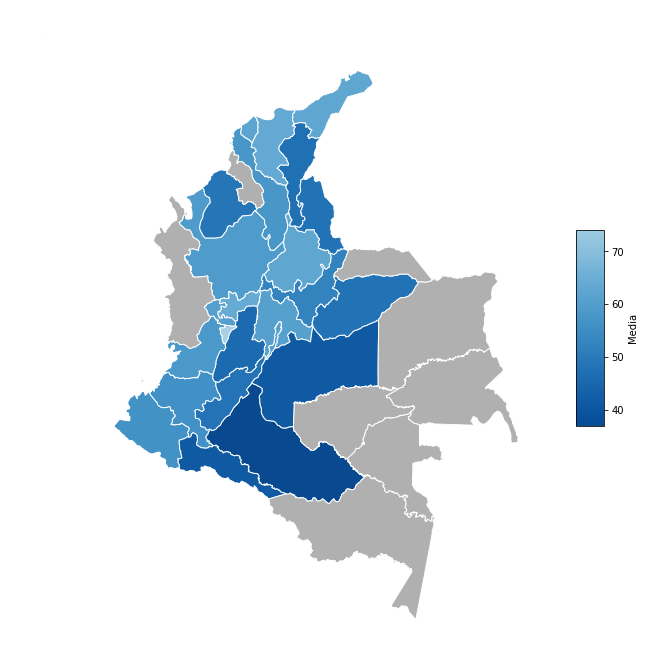

In [9]:
# Descargar shape files
# https://sites.google.com/site/seriescol/shapes
shp = gpd.read_file('depto.shp')
# promedio por departamento
dat_map = estadisticos.filter(
    items = ['yb'] # Escoger la media
).reset_index(
    level=0 # Agregar el código al dataframe
).rename(
    columns = {'codigo' : 'DPTO','yb' : 'Media'} # Renombrar columnas
)
shp.DPTO = [int(c) for c in shp.DPTO] # Convertir los códigos en enteros
plot_data = shp.merge(dat_map, how = 'left',on = 'DPTO').filter( # Hacer left-join
    items = ['DPTO','Media','geometry'] # Seleccionar columnas necesarias para el gráfico
)

# plot
fig, ax = plt.subplots(figsize = (12,12))
plot_data.plot(
    column = 'Media', # Variable que da color
    legend = True, # Poner la barra de colores de referencia
    missing_kwds = {'color' : '#b0b0b0'}, # Los departamentos sin información tendrán ese color
    ax = ax,
    # --- Los siguientes argumentos no son --- #
    # --- necesarios pero sí ayudan a -------- #
    # --- perfeccionar el gráfico ------------ #
    cmap = 'Blues_r', # Escala de colores a utilizar
    vmin = 30, vmax = 100, # Mínimo y máximo en la escala de colores
    edgecolor = 'white', # Border blancos
    legend_kwds = {'label' : 'Media', # Título de la barra de colores
                  'shrink' : 0.3, # Altura de la barra
                  'aspect' : 7, # Razón Altura/Ancho de la barra
                  'boundaries' : np.linspace(37,74,num = 100), # Puntos de la escala de colores a mostrar (la original es más extensa)    
                  'ticks' : [40,50,60,70]} # Números guía junto a la barra de colores.
)
ax.axis('off') # Quitar los ejes
plt.show()

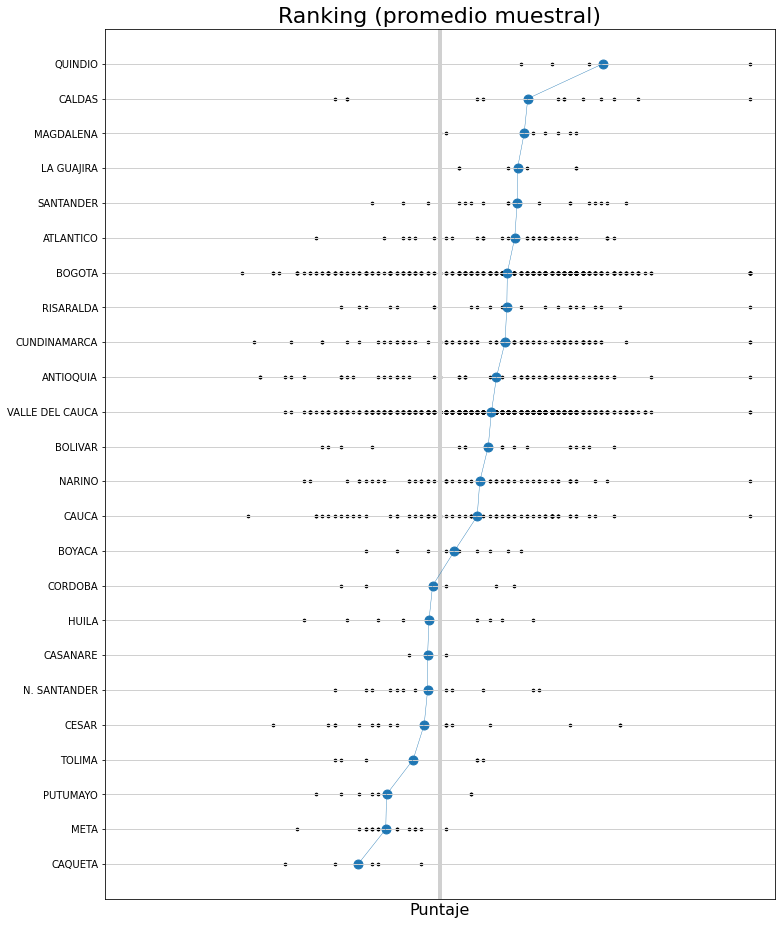

In [10]:
# representacion de los puntajes brutos
fig, ax = plt.subplots(figsize = (12,16))
ax.set_xlim((-4,104));ax.set_ylim((0,m+1)) # Límites del gráfico
ax.axvline(x = 50, color = '#d0d0d0', linewidth = 4) # Linea vertical central
order = np.array(np.argsort(yb)) # orden de los departamentos según la media
for k in range(m):
    ax.axhline(y = k+1, color = '#d0d0d0', linewidth = 1) # Lineas horizontales
    j = order[k]
    ax.scatter(x = Y[j],y = [k+1]*nj[j], # observaciones por departamento
               color = 'black',s = 7)
ax.scatter(x = yb[order], y = range(1,m+1),s = 80) # media de departamento
ax.plot(yb[order],range(1,m+1),linewidth = 0.4)
ax.set_title('Ranking (promedio muestral)',fontdict = {'fontsize' : 22}) # Título
ax.set_xticks(ticks = []) # Quitar coordenadas del eje x
ax.set_yticks(ticks = range(1,m+1), # Poner departamentos en el eje y
              labels = np.array(estadisticos.reset_index(level = 1).nombre)[order])
ax.set_xlabel('Puntaje',fontdict = {'fontsize' : 16})
plt.show()

In [11]:
np.array(estadisticos.reset_index(level = 1).nombre)[order]

array(['CAQUETA', 'META', 'PUTUMAYO', 'TOLIMA', 'CESAR', 'N. SANTANDER',
       'CASANARE', 'HUILA', 'CORDOBA', 'BOYACA', 'CAUCA', 'NARINO',
       'BOLIVAR', 'VALLE DEL CAUCA', 'ANTIOQUIA', 'CUNDINAMARCA',
       'RISARALDA', 'BOGOTA', 'ATLANTICO', 'SANTANDER', 'LA GUAJIRA',
       'MAGDALENA', 'CALDAS', 'QUINDIO'], dtype=object)

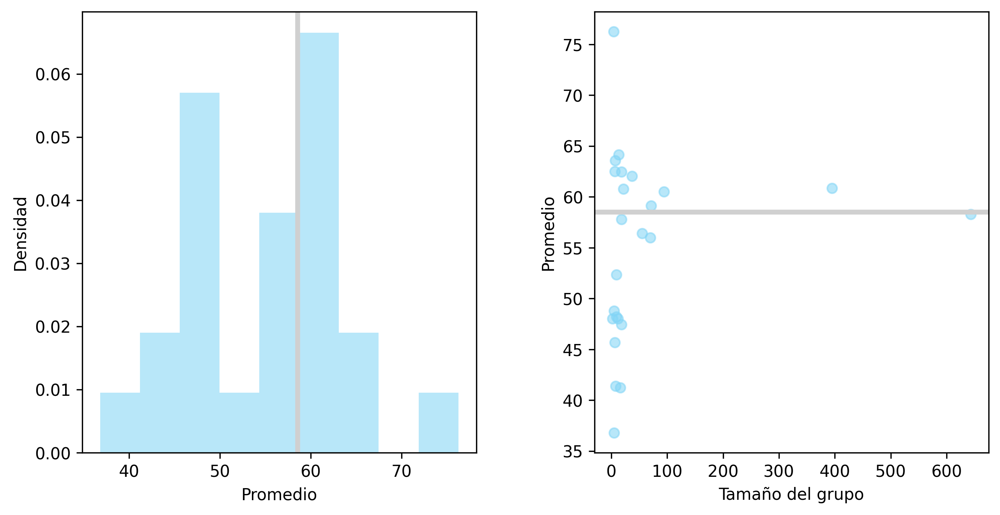

In [12]:
f, axes = plt.subplots(1, 2, figsize = (10,5),dpi = 300)
plt.subplots_adjust(wspace = 0.3, hspace = 0.2)
axes[0].hist(yb,bins = 9,density = True,color = "#82D5F690")
axes[0].axvline(x = np.mean(y), color = '#d0d0d0', linewidth = 3)
axes[0].set_xlabel("Promedio")
axes[0].set_ylabel("Densidad")
#
axes[1].scatter(nj,yb,color = '#82D5F690')
axes[1].axhline(y = np.mean(y), color = '#d0d0d0', linewidth = 3)
axes[1].set_ylabel("Promedio")
axes[1].set_xlabel("Tamaño del grupo")
plt.show()

Es común que los grupos con promedios muestrales muy altos o muy bajos correspondan a aquellos grupos con tamaños muestrales bajos, ya que $\textsf{Var}(\bar{y}) = \sigma^2/n$.

### 4.3 Distribución previa

Teniendo en cuenta la información de la prueba, el modelo se ajusta utilizando los siguientes hiperparámetros: 
$$
\mu_0 = 50\,,\qquad
\gamma^2_0 = 25\,,\qquad
\eta_0 = 1\,,\qquad
\tau^2_0 = 100\,,\qquad
\nu_0 = 1\,,\qquad
\sigma^2_0 = 100\,.
$$

### 4.4 Ajuste del modelo

In [13]:
# algoritmo
def MCMC(B,nj,yb,s2):
    # tamaños
    n = np.sum(nj)
    m = len(nj)
    # hiperparametros
    mu0 = 50
    g20 = 25
    eta0 = 1  
    t20  = 100
    nu0  = 1  
    s20  = 100
    # valores iniciales
    theta = yb
    sig2  = np.mean(s2)
    mu    = np.mean(theta)
    tau2  = np.var(theta,ddof = 1)
    # almacenamiento
    THETA = []
    LL = []
    # cadena
    for b in range(B):
        # actualizar theta
        vtheta = 1/(1/tau2 + nj/sig2)
        theta = st.norm.rvs(vtheta*(mu/tau2 + nj*yb/sig2),
                            scale = np.sqrt(vtheta),
                            size = m)
        # actualizar sigma^2
        sig2 = st.invgamma.rvs(a = (nu0 + n)/2, 
                               scale = (nu0*s20 + np.sum((nj - 1)*s2 + nj*(yb - theta)**2))/2,
                               size = 1)
        # actualizar mu
        vmu = 1/(1/g20 + m/tau2)
        mu = st.norm.rvs(vmu*(mu0/g20 + m*np.mean(theta)/tau2),
                        scale = np.sqrt(vmu),
                        size = 1)
        # actualizar tau^2
        tau2 = st.invgamma.rvs(a = (eta0 + m)/2, 
                               scale = (eta0*t20 + m*np.var(theta) + m*(np.mean(theta) - mu)**2)/2,
                               size = 1)
        # almacenar valores
        THETA.append(list(theta)+[sig2[0],mu[0],tau2[0]])
        # log-verosimilitud
        LL.append(np.sum(
            st.norm.logpdf(x = y, loc = np.repeat(theta,nj), scale = np.sqrt(sig2))
        ))
    # fin de la cadena
    # salida
    THETA = pd.DataFrame(THETA,
                         columns = ['theta'+str(k+1) for k in range(m)]+['sig2','mu','tau2'])
    LL = pd.DataFrame(LL, columns = ['ll'])
    return {'THETA' : THETA, 'LL' : LL}

In [14]:
# ajuste del modelo
t = time.time()
np.random.seed(123)
B = int(1e4)
cadena1 = MCMC(B,nj,yb,s2)
print(time.time() - t,"sec elapsed")

8.015627384185791 sec elapsed


In [15]:
cadena1['THETA'].head(3)

,theta1,theta2,theta3,theta4,theta5,theta6,theta7,theta8,theta9,theta10,...,theta18,theta19,theta20,theta21,theta22,theta23,theta24,sig2,mu,tau2
0,57.380602,63.742127,61.013292,53.198294,50.559100,68.420487,30.074271,55.326414,51.786944,46.303818,...,80.793171,62.922910,62.823834,51.260724,59.039094,45.375722,48.767343,177.919614,53.697564,116.808120
1,57.456351,61.422627,60.255997,56.687776,41.023389,56.856648,37.090482,57.413766,47.408132,49.958456,...,71.952225,60.282058,68.984132,49.300664,58.803509,66.368189,37.752421,179.451454,51.710510,117.929947
2,59.004054,63.953418,61.424849,62.625486,58.419998,66.609210,36.225705,57.167799,48.729818,42.522062,...,64.749072,63.396592,58.281144,36.519183,58.833221,46.723897,42.479610,176.773164,56.970901,222.505422


### 4.5 Convergencia

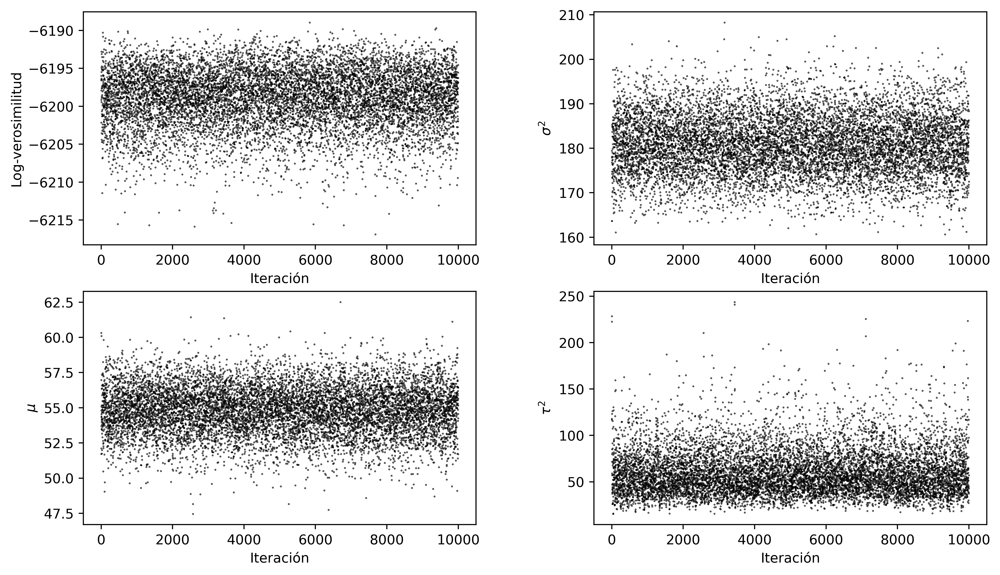

In [16]:
# cadenas
f, axes = plt.subplots(2, 2, figsize = (12,7),dpi = 500)
plt.subplots_adjust(wspace = 0.3, hspace = 0.2)
#
axes[0,0].scatter(range(B),cadena1['LL'].ll,c = 'black',s=0.1)
axes[0,0].set_xlabel('Iteración')
axes[0,0].set_ylabel('Log-verosimilitud')
#
axes[0,1].scatter(range(B),cadena1['THETA'].sig2,c = 'black',s=0.1)
axes[0,1].set_xlabel('Iteración')
axes[0,1].set_ylabel(r'$\sigma^2$')
#
axes[1,0].scatter(range(B),cadena1['THETA'].mu,c = 'black',s=0.1)
axes[1,0].set_xlabel('Iteración')
axes[1,0].set_ylabel(r'$\mu$')
#
axes[1,1].scatter(range(B),cadena1['THETA'].tau2,c = 'black',s=0.1)
axes[1,1].set_xlabel('Iteración')
axes[1,1].set_ylabel(r'$\tau^2$')
#
plt.show()

In [17]:
# tamaños efecitvos de muestra
neff_SMT = [ess(np.array(cadena1['THETA'])[:,k]) for k in range(m,m+3)]
tab = pd.DataFrame(data = [neff_SMT], columns = ['sig2','mu','tau2'])
round(tab,3)

,sig2,mu,tau2
0,8788.624,6334.252,3748.026


In [18]:
neff_THETA = [ess(np.array(cadena1['THETA'])[:,k]) for k in range(m)]
pd.DataFrame(neff_THETA,columns = ['THETA']).describe()

,THETA
count,24.000000
mean,8955.201209
std,865.212471
min,6455.508830
25%,8782.345979
50%,9150.707810
75%,9479.555599
max,9950.041848


In [19]:
# errores estandar de MC
std_SMT = [np.std(np.array(cadena1['THETA'])[:,k]) for k in range(m,m+3)]
tmp = std_SMT/np.sqrt(neff_SMT)
tab = pd.DataFrame(data = [tmp], columns = ['sig2','mu','tau2'])
round(tab,3)

,sig2,mu,tau2
0,0.07,0.021,0.411


In [20]:
std_THETA = [np.std(np.array(cadena1['THETA'])[:,k]) for k in range(m)]
tmp = std_THETA/np.sqrt(neff_THETA)
pd.DataFrame(tmp,columns = ['THETA']).describe()

,THETA
count,24.000000
mean,0.034833
std,0.017433
min,0.005278
25%,0.020294
50%,0.034903
75%,0.046827
max,0.066730


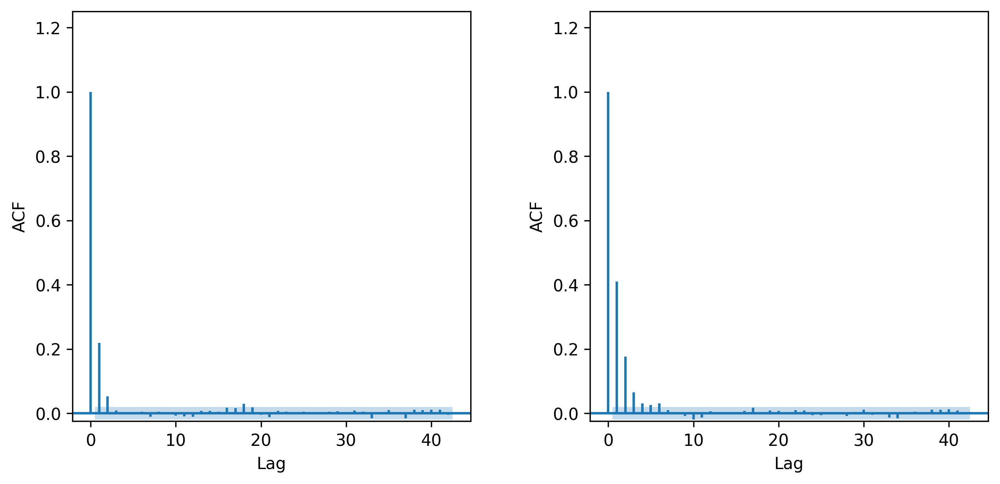

In [21]:
# autocorrelaciones
f, axes = plt.subplots(1, 2, figsize = (10,4.6), dpi = 300)
plt.subplots_adjust(wspace = 0.3, hspace = 0.2)
plot_acf(cadena1['THETA'].mu, 
         lags = 42, 
         ax = axes[0], 
         marker = '', 
         adjusted = True,
         auto_ylims = True,
         bartlett_confint = False
)
axes[0].set_title('')
axes[0].set_xlabel('Lag')
axes[0].set_ylabel('ACF')
plot_acf(cadena1['THETA'].tau2, 
         lags = 42, 
         ax = axes[1], 
         marker = '', 
         adjusted = True,
         auto_ylims = True,
         bartlett_confint = False
)
axes[1].set_title('')
axes[1].set_xlabel('Lag')
axes[1].set_ylabel('ACF')
plt.show()

In [22]:
# cadena
np.random.seed(2)
cadena2 = MCMC(B,nj,yb,s2)
np.random.seed(3)
cadena3 = MCMC(B,nj,yb,s2)

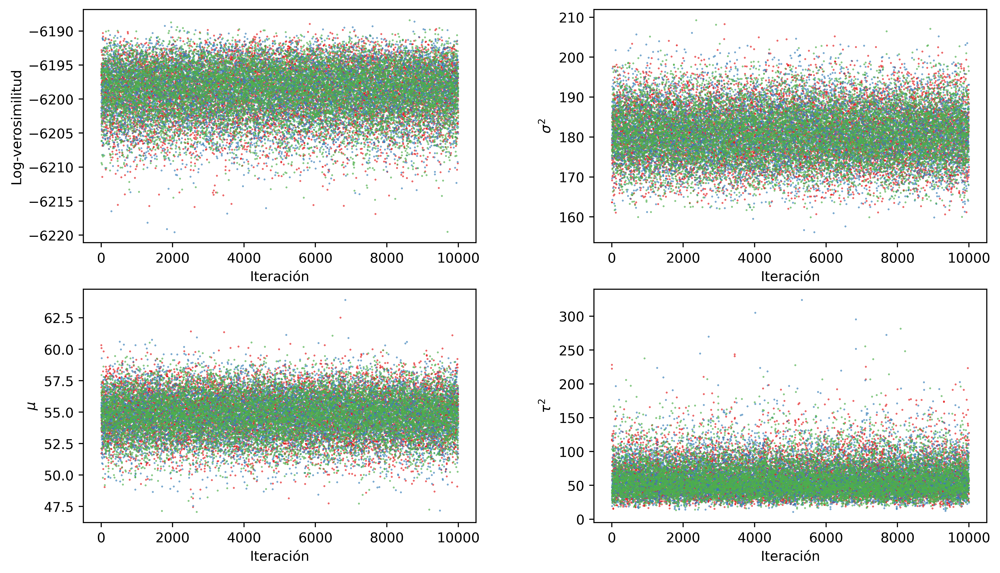

In [23]:
# cadenas
col = ["#E41A1C","#377EB8", "#4DAF4A", "#984EA3", "#FF7F00",
       "#FFFF33", "#A65628", "#F781BF", "#999999"]
#
f, axes = plt.subplots(2, 2, figsize = (12,7),dpi = 500)
plt.subplots_adjust(wspace = 0.3, hspace = 0.2)
#
axes[0,0].scatter(range(B),cadena1['LL'].ll,c = col[0],s=0.1)
axes[0,0].scatter(range(B),cadena2['LL'].ll,c = col[1],s=0.1)
axes[0,0].scatter(range(B),cadena3['LL'].ll,c = col[2],s=0.1)
axes[0,0].set_xlabel('Iteración')
axes[0,0].set_ylabel('Log-verosimilitud')
#
axes[0,1].scatter(range(B),cadena1['THETA'].sig2,c = col[0],s=0.1)
axes[0,1].scatter(range(B),cadena2['THETA'].sig2,c = col[1],s=0.1)
axes[0,1].scatter(range(B),cadena3['THETA'].sig2,c = col[2],s=0.1)
axes[0,1].set_xlabel('Iteración')
axes[0,1].set_ylabel(r'$\sigma^2$')
#
axes[1,0].scatter(range(B),cadena1['THETA'].mu,c = col[0],s=0.1)
axes[1,0].scatter(range(B),cadena2['THETA'].mu,c = col[1],s=0.1)
axes[1,0].scatter(range(B),cadena3['THETA'].mu,c = col[2],s=0.1)
axes[1,0].set_xlabel('Iteración')
axes[1,0].set_ylabel(r'$\mu$')
#
axes[1,1].scatter(range(B),cadena1['THETA'].tau2,c = col[0],s=0.1)
axes[1,1].scatter(range(B),cadena2['THETA'].tau2,c = col[1],s=0.1)
axes[1,1].scatter(range(B),cadena3['THETA'].tau2,c = col[2],s=0.1)
axes[1,1].set_xlabel('Iteración')
axes[1,1].set_ylabel(r'$\tau^2$')
#
plt.show()

### 4.6 Inferencia

In [24]:
# inferencia sobre sig2, mu, tau2, eta
# eta = proporcion de intravarianza
tmp = [
    np.sqrt(cadena1['THETA'].sig2), # sigma
    cadena1['THETA'].mu, # mu
    np.sqrt(cadena1['THETA'].tau2), # tau
    100*cadena1['THETA'].sig2/(cadena1['THETA'].sig2+cadena1['THETA'].tau2) # eta = 100 * sigma^2 / (sigma^2 + tau^2)
]
PAR = np.array(tmp).T
tab = [[np.mean(samp)] + list(np.quantile(samp,q = [0.5,0.025,0.975])) for samp in tmp]
tab = pd.DataFrame(tab,
                   columns = ['Media','Per.50%','Per.2.5%','Per.97.5%'],
                  index = [r'$\sigma$',r'$\mu$',r'$\tau$',r'$\eta$'])
tab

,Media,Per.50%,Per.2.5%,Per.97.5%
$\sigma$,13.447888,13.443891,12.975931,13.940640
$\mu$,54.829831,54.864084,51.344124,58.085638
$\tau$,7.640271,7.468697,5.138793,11.099388
$\eta$,75.591457,76.450860,59.424003,87.337889


Text(0, 0.5, 'Densidad')

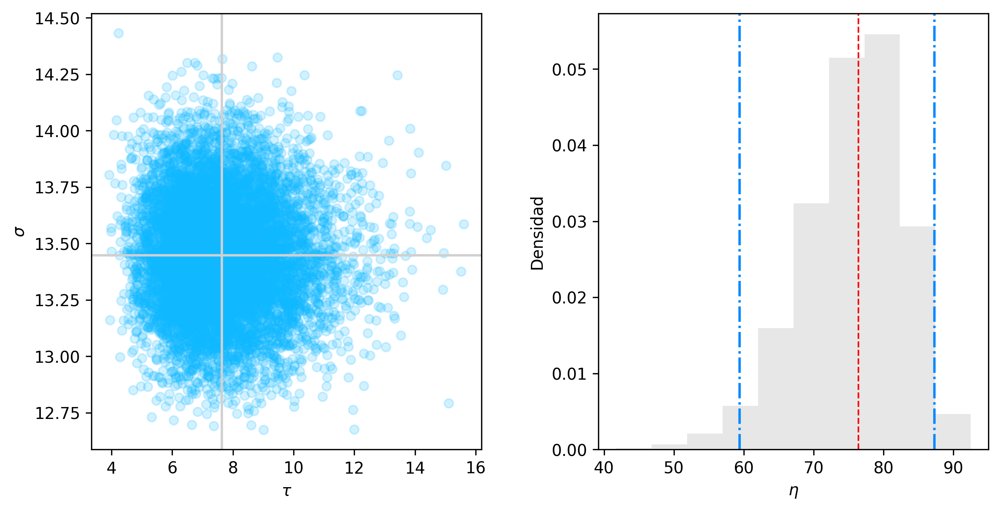

In [25]:
f, axes = plt.subplots(1, 2, figsize = (10,5), dpi = 300)
plt.subplots_adjust(wspace = 0.3, hspace = 0.2)
# sigma vs. tau
axes[0].scatter(PAR[:,2],PAR[:,0],s=30,color = '#10b9FF30')
axes[0].axvline(x = np.mean(PAR[:,2]), color = '#d0d0d0', linewidth = 1.5)
axes[0].axhline(y = np.mean(PAR[:,0]), color = '#d0d0d0', linewidth = 1.5)
axes[0].set_xlabel(r'$\tau$')
axes[0].set_ylabel(r'$\sigma$')
# eta
axes[1].hist(PAR[:,3],color = '#ddddddb0',density = True)
axes[1].axvline(x = np.quantile(PAR[:,3],q = [0.025])[0], color = '#0089FF',ls = '-.')
axes[1].axvline(x = np.quantile(PAR[:,3],q = [0.975])[0], color = '#0089FF',ls = '-.')
axes[1].axvline(x = np.quantile(PAR[:,3],q = [0.5])[0], color = '#ff0000',ls = '--',linewidth = 1)
axes[1].set_xlabel(r'$\eta$')
axes[1].set_ylabel('Densidad')

- La media global es aproximadamente 55, lo cual coincide con el diseño de la prueba.
- Aprox. el 75\% de la variabilidad de los puntajes corresponde a la variabiliadad dentro de los departamentos.
- Aprox. el 99\% de los puntajes dentro de los departamentos están distanciados a 3 × 13 = 39 puntos entre sí. 
- Aprox. el 99\% de los puntajes promedio de los departamentos están distanciados a 3 × 9 = 27 puntos entre sí.


### 4.7 Ranking

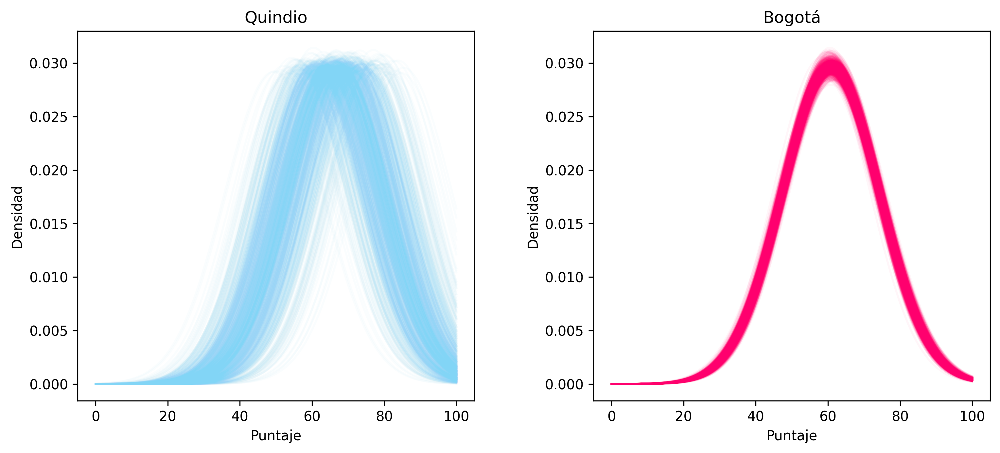

In [26]:
f, axes = plt.subplots(1, 2, figsize = (12,5), dpi = 300)
plt.subplots_adjust(wspace = 0.3, hspace = 0.2)
#
y_grid = np.linspace(0,100,num = 500)
for b in range(1000):
    axes[0].plot(y_grid,st.norm.pdf(y_grid, 
                                    np.array(cadena1['THETA'])[b,17],
                                   scale = np.sqrt(np.array(cadena1['THETA'])[b,m])),
                color = '#82D5F609')
axes[0].set_xlabel('Puntaje')
axes[0].set_ylabel('Densidad')
axes[0].set_title('Quindio')
#
for b in range(1000):
    axes[1].plot(y_grid,st.norm.pdf(y_grid, 
                                    np.array(cadena1['THETA'])[b,2],
                                   scale = np.sqrt(np.array(cadena1['THETA'])[b,m])),
                color = '#FF006E09')
axes[1].set_xlabel('Puntaje')
axes[1].set_ylabel('Densidad')
axes[1].set_title('Bogotá')
#
plt.show()

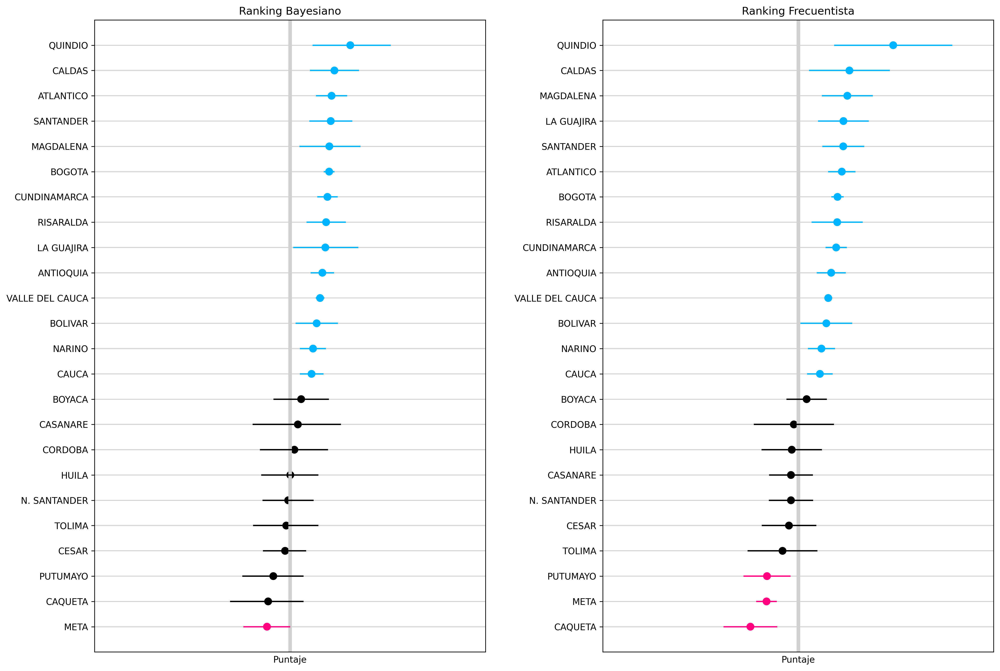

In [27]:
# ranking bayesiano
ids2 = np.array(estadisticos.reset_index(level = 1).nombre)
that = np.mean(np.array(cadena1['THETA'])[:,:m],axis = 0)
ic1 = [list(np.quantile(np.array(cadena1['THETA'])[:,k], q = [0.025,0.975])) for k in range(m)]
ranking = np.array(np.argsort(that))
ids2 = ids2[ranking]
that = that[ranking]
ic1  = np.array(ic1)[ranking,:]
colo = np.array([2]*m)
colo[ic1[:,0]>50] = 1
colo[ic1[:,1]<50] = 3
colo = np.array(['#00B3FF','#000000','#FF0080'])[colo-1]
# grafico
f, ax = plt.subplots(1, 2, figsize = (18,13), dpi = 300)
plt.subplots_adjust(wspace = 0.3, hspace = 0.2)
#
ax[0].set_xlim((-4,104));ax[0].set_ylim((0,m+1)) # Límites del gráfico
ax[0].axvline(x = 50, color = '#d0d0d0', linewidth = 4) # Linea vertical central
for k in range(m):
    ax[0].axhline(y = k+1, color = '#d0d0d0', linewidth = 1) # Lineas horizontales
    ax[0].plot(ic1[k,:],[k+1]*2, # intervalo de credibilidad por departamento
               color = colo[k])
ax[0].scatter(x = that, y = range(1,m+1),s = 60,color = colo) # media posterior de departamento
ax[0].set_title('Ranking Bayesiano') # Título
ax[0].set_xticks(ticks = []) # Quitar coordenadas del eje x
ax[0].set_yticks(ticks = range(1,m+1), # Poner departamentos en el eje y
              labels = ids2)
ax[0].set_xlabel('Puntaje')
# ranking frecuentista
ids2 = np.array(estadisticos.reset_index(level = 1).nombre)
that = yb
plus_minus = np.array([-1,1])
ic2 = [yb[k]+plus_minus*st.norm.ppf(0.975)*np.sqrt(s2[k])/np.sqrt(nj[k]) for k in range(m)]
ranking = np.array(np.argsort(that))
ids2 = ids2[ranking]
that = that[ranking]
ic2  = np.array(ic2)[ranking,:]
colo = np.array([2]*m)
colo[ic2[:,0]>50] = 1
colo[ic2[:,1]<50] = 3
colo = np.array(['#00B3FF','#000000','#FF0080'])[colo-1]
# grafico
ax[1].set_xlim((-4,104));ax[1].set_ylim((0,m+1)) # Límites del gráfico
ax[1].axvline(x = 50, color = '#d0d0d0', linewidth = 4) # Linea vertical central
for k in range(m):
    ax[1].axhline(y = k+1, color = '#d0d0d0', linewidth = 1) # Lineas horizontales
    ax[1].plot(ic2[k,:],[k+1]*2, # intervalo de confianza por departamento
               color = colo[k])
ax[1].scatter(x = that, y = range(1,m+1),s = 60,color = colo) # estimación de la media de departamento
ax[1].set_title('Ranking Frecuentista') # Título
ax[1].set_xticks(ticks = []) # Quitar coordenadas del eje x
ax[1].set_yticks(ticks = range(1,m+1), # Poner departamentos en el eje y
              labels = ids2)
ax[1].set_xlabel('Puntaje')
#
plt.show()

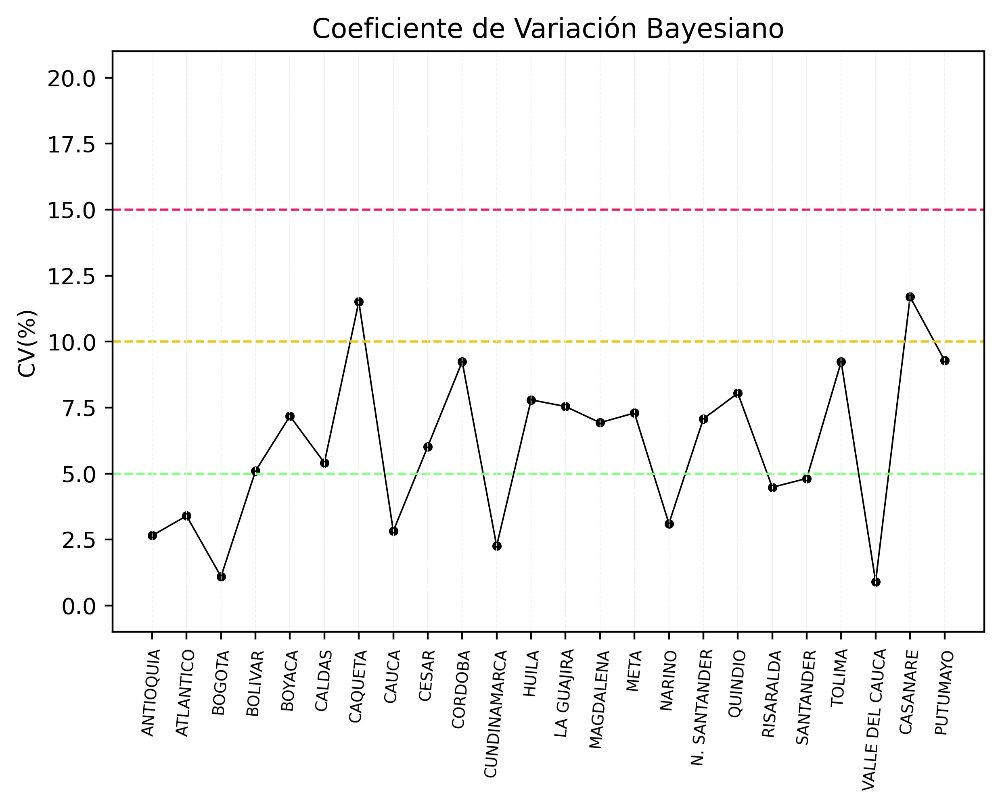

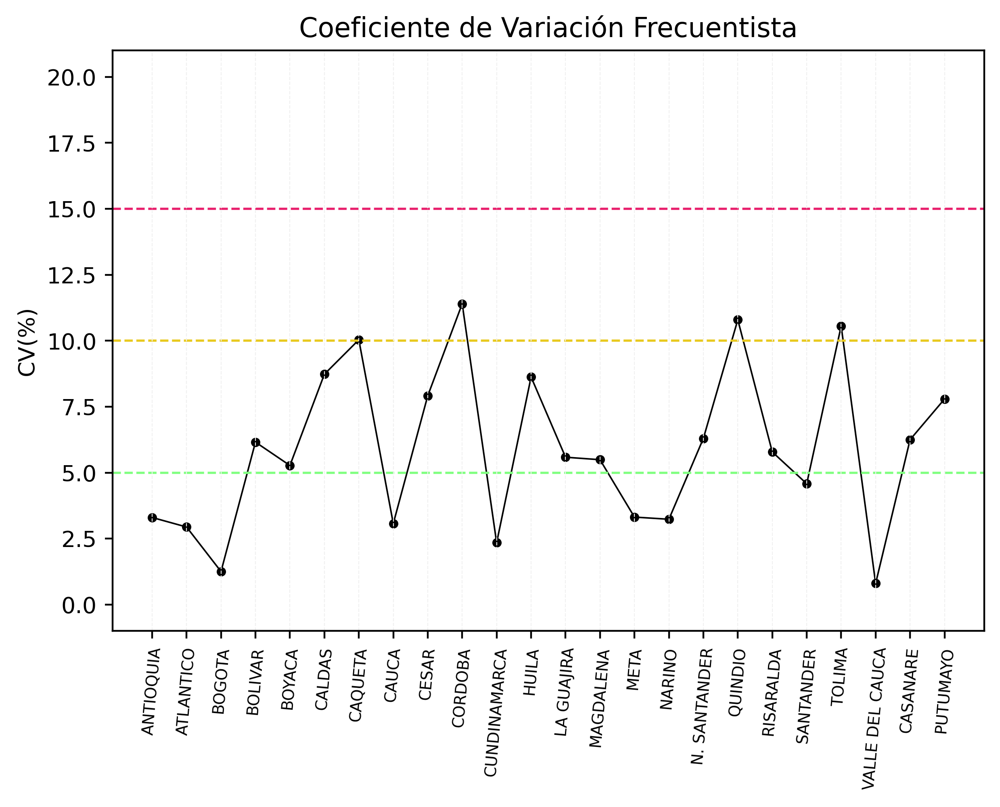

In [28]:
# cv bayesiano
ids2 = np.array(estadisticos.reset_index(level = 1).nombre)
that = np.mean(np.array(cadena1['THETA'])[:,:m],axis = 0)
shat = np.std(np.array(cadena1['THETA'])[:,:m],axis = 0)
cv = 100*shat/that
# grafico
f = plt.figure(figsize = (6,4), dpi = 400)
axes = f.add_axes([0.1,0.1,0.9,0.9])
axes.set_ylabel('CV(%)')
axes.scatter(range(m), cv, color = '#000000',s=10)  
axes.plot(range(m), cv, linewidth = 0.7, color = '#000000')  
axes.axhline(y = 5, color = '#80ff80', ls = '--', linewidth = 1)
axes.axhline(y = 10, color = '#E8C91E', ls = '--', linewidth = 1)
axes.axhline(y = 15, color = '#E81E6B', ls = '--', linewidth = 1)
for k in range(m):
    axes.axvline(x = k, color = '#f0f0f0',ls = '--', linewidth = 0.4)
axes.set_ylim([-1,21])
axes.set_xticks(ticks = range(m),labels = ids2)
axes.set_xticklabels(ids2, rotation = 85,fontdict = {'fontsize' : 7})
axes.set_title('Coeficiente de Variación Bayesiano')
#

# cv frecuentista
ids2 = np.array(estadisticos.reset_index(level = 1).nombre)
that = yb
shat = np.sqrt(s2/nj)
cv = 100*shat/that
# grafico
f = plt.figure(figsize = (6,4), dpi = 400)
axes = f.add_axes([0.1,0.1,0.9,0.9])
axes.set_ylabel('CV(%)')
axes.scatter(range(m), cv, color = '#000000',s = 10)  
axes.plot(range(m), cv, linewidth = 0.7, color = '#000000')  
axes.axhline(y = 5, color = '#80ff80', ls = '--', linewidth = 1)
axes.axhline(y = 10, color = '#E8C91E', ls = '--', linewidth = 1)
axes.axhline(y = 15, color = '#E81E6B', ls = '--', linewidth = 1)
for k in range(m):
    axes.axvline(x = k, color = '#f0f0f0',ls = '--', linewidth = 0.4)
axes.set_ylim([-1,21])
axes.set_xticks(ticks = range(m),labels = ids2)
axes.set_xticklabels(ids2, rotation = 85,fontdict = {'fontsize' : 7})
axes.set_title('Coeficiente de Variación Frecuentista')
#
plt.show()

### 4.8 Encogimiento (*shrinkage*)

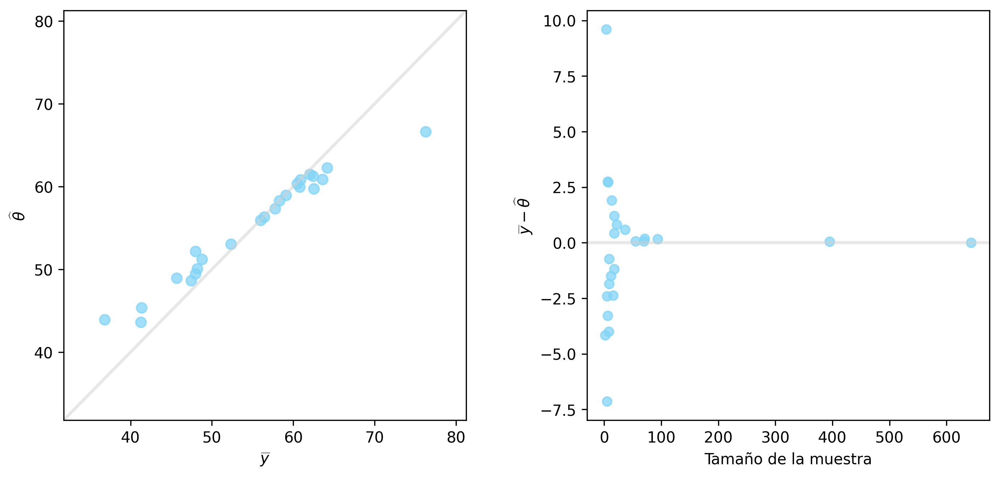

In [29]:
# encogimiento (shrinkage)
f, axes = plt.subplots(1, 2, figsize = (11,5), dpi = 300)
plt.subplots_adjust(wspace = 0.3, hspace = 0.2)
# theta hat vs. promedio muestral
theta_hat = np.mean(np.array(cadena1['THETA'])[:,:m],axis = 0)
extrema = (min(list(yb)+list(theta_hat))-5,max(list(yb)+list(theta_hat))+5)
axes[0].set_xlim(extrema)
axes[0].set_ylim(extrema)
axes[0].scatter(yb,theta_hat,s = 45,c = '#82D5F6c0')
axes[0].plot([0,100],[0,100],color = '#d0d0d080',linewidth = 2)
axes[0].set_xlabel(r'$\widebar{y}$')
axes[0].set_ylabel(r'$\widehat\theta$')
# diferencia vs. tamaño de muestra
axes[1].scatter(nj,yb-theta_hat,color = '#82D5F6c0')
axes[1].axhline(y = 0, color = '#d0d0d080', linewidth = 2)
axes[1].set_ylabel(r'$\widebar{y} - \widehat{\theta}$')
axes[1].set_xlabel("Tamaño de la muestra")
plt.show()

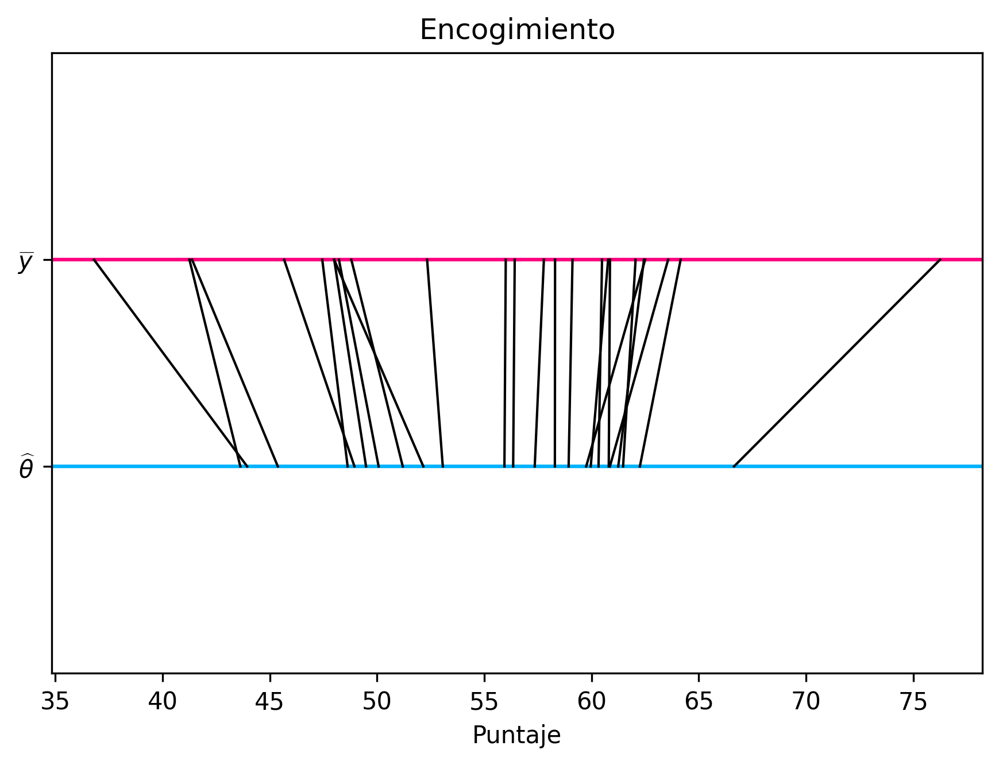

In [30]:
# encogimiento (shrinkage)
f = plt.figure(figsize = (6,4), dpi = 300)
axes = f.add_axes([0.1,0.1,0.9,0.9])
axes.set_yticks(ticks = [1,2],labels = [r'$\widehat\theta$',r'$\widebar{y}$'])
axes.set_ylim((0,3))
axes.axhline(y = 1,color = '#00B3FF')
axes.axhline(y = 2,color = '#FF0080')
for k in range(m):
    axes.plot([theta_hat[k],yb[k]],[1,2],color = 'black',linewidth = 1)
axes.set_xlabel("Puntaje")
axes.set_title('Encogimiento')

plt.show()